<a href="https://colab.research.google.com/github/letrongminh/MDL4Training/blob/main/Yolov5_custom_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount("/content/drive/")

Mounted at /content/drive/


# Dataset is blood cells photos
1. clone yolov5 repostory

In [6]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 10086, done.
remote: Total 10086 (delta 0), reused 0 (delta 0), pack-reused 10086
Receiving objects: 100% (10086/10086), 10.41 MiB | 23.28 MiB/s, done.
Resolving deltas: 100% (6989/6989), done.


In [7]:
%cd yolov5
# install dependencies (-qr: ignore error)
!pip install -qr /content/yolov5/requirements.txt

/content/yolov5
     |████████████████████████████████| 596 kB 4.7 MB/s 


In [8]:
!unzip "/content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/BCCD.v4-416x416_aug.yolov5pytorch.zip" -d "/content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/"

Archive:  /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/BCCD.v4-416x416_aug.yolov5pytorch.zip
 extracting: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/README.dataset.txt  
 extracting: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/README.roboflow.txt  
 extracting: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/data.yaml  
   creating: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/test/
   creating: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/test/images/
 extracting: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/test/images/BloodImage_00038_jpg.rf.ffa23e4b5b55b523367f332af726eae8.jpg  
 extracting: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/test/images/BloodImage_00044_jpg.rf.e7760375eba4bc20c5746367e2311e18.jpg  
 extracting: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/test/images/BloodImage_00062_jpg.rf.1be1ca0ecdf783798fc10346baaa203e.jpg  
 extracting: /content/drive/MyDrive/Colab Notebooks (1)/CV/Yolo/test/images/BloodImage_000

In [13]:
!python train.py --img 416 --batch 16 --epochs 30 --data data_BCCD.yaml --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=, data=data_BCCD.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=30, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-114-ga4207a2 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, s

# Custom YOLOv5 Detector Performance

In [16]:
%load_ext tensorboard
%tensorboard --logdir runs/train/exp2/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Test image

In [23]:
%cd /content/yolov5/
!python detect.py --weights runs/train/exp2/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/Colab_Notebooks_1/CV/Yolo/BCCD/test/images


/content/yolov5
detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/Colab_Notebooks_1/CV/Yolo/BCCD/test/images, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-114-ga4207a2 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /content/drive/.shortcut-targets-by-id/1GFz6iKprg0Q336XjGiMEMaho2vrCQITk/Colab Notebooks/CV/Yolo/BCCD/test/images/BloodImage_00038_jpg.rf.ffa23e4b5b55b523367f332af726eae8.jpg: 416x416 1 Platelets, 16 RBCs, 1 WBC, Done. (0.028s)
image 2/36 /content/drive/.shortcut-targets-by-id/1GFz6iKprg0Q336XjGiMEMaho2vrCQITk/Colab Notebo

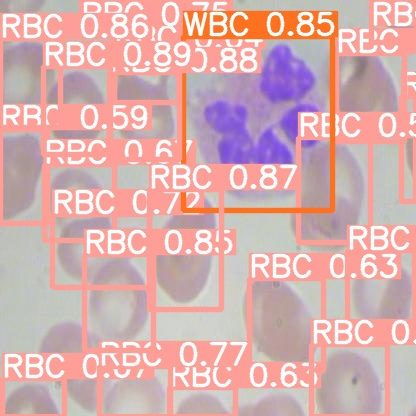

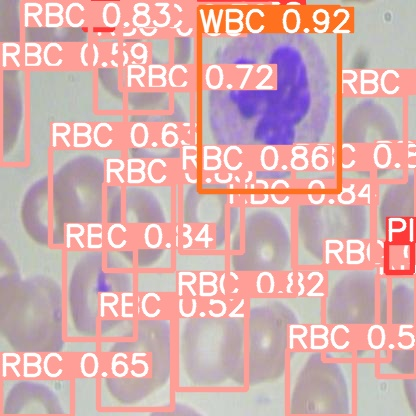

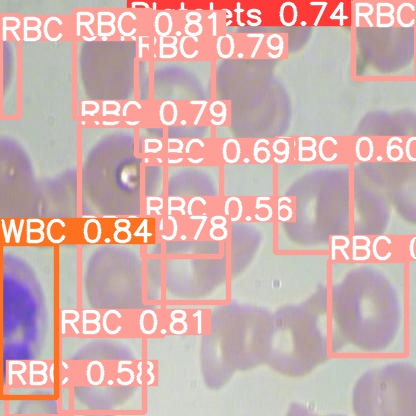

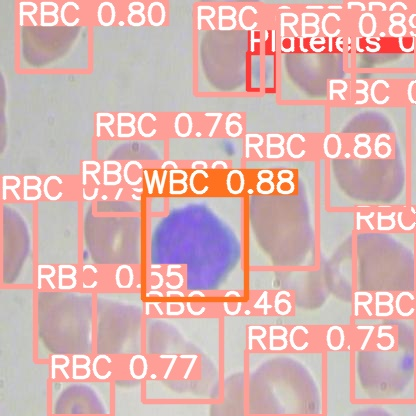

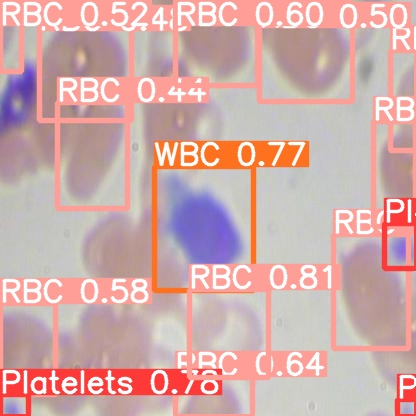

...

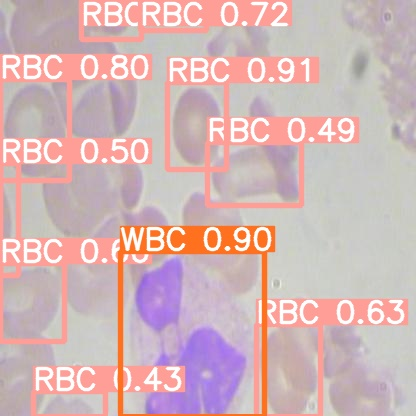

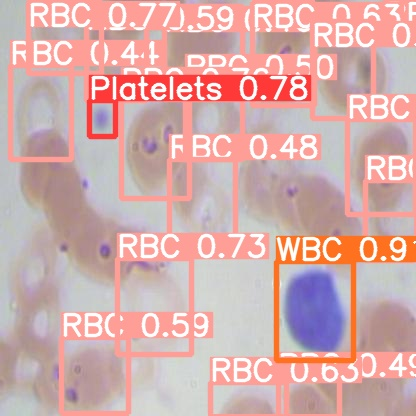

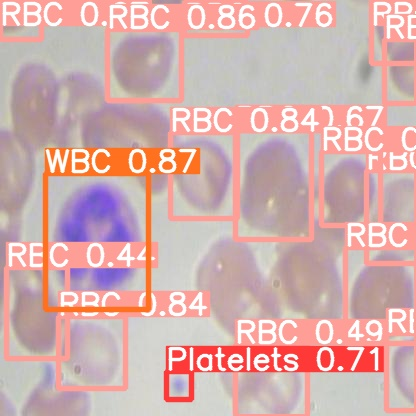

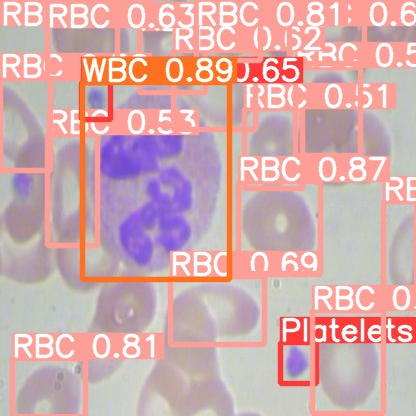

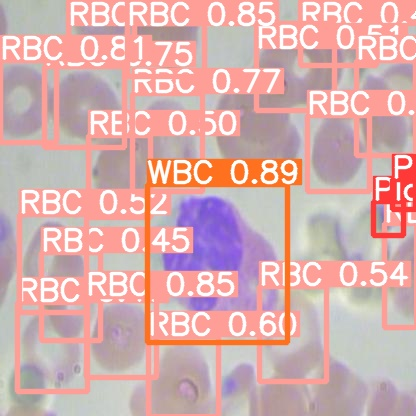

In [24]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")